# Preprocessing

In this notebook I will standardize my numeric features using a scaler and split the data into training and testing datasets. My dummy variables are already created as I made them in the data wrangling step so they would not effect my summary statistics in the EDA step. I will then proceed to test models to predict if a game is above the mean suggestions or not.

### Imports

In [1]:
import pandas as pd
import numpy as np
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import tree, metrics
import seaborn as sns
import matplotlib.pyplot as plt
from io import StringIO  
from IPython.display import Image  
import pydotplus

### Loading Data

In [2]:
game_data = pd.read_csv("data/game_data_cleaned.csv")

Before splitting the data I will change the suggestions_count column to a boolean with True if it is above the mean.

In [3]:
mean_suggestions = game_data['suggestions_count'].mean()
mean_suggestions

99.60501266644638

In [4]:
game_data['suggestions_target'] = np.where(game_data['suggestions_count'] > mean_suggestions, 'Above', 'Equal or Below')

In [5]:
game_data['suggestions_target'].value_counts()

Equal or Below    232561
Above             112445
Name: suggestions_target, dtype: int64

In [6]:
game_data.drop(columns='suggestions_count', inplace=True)

### Train/Test Split

I am going to split the data into 70/30 train/test datasets. As the number of suggestions is my target, I will set suggestions_count as my y variable

In [7]:
#I have changed the y variable since making the pre-processing notebook as I have decided to make the suggestions column a
#categorical variable
X_train, X_test, y_train, y_test = train_test_split(game_data.drop(columns='suggestions_target'), 
                                                    game_data.suggestions_target, test_size=0.3, 
                                                    random_state=42)

In [8]:
X_train.shape, X_test.shape

((241504, 73), (103502, 73))

In [9]:
y_train.shape, y_test.shape

((241504,), (103502,))

I will now check that the dtypes of both X sets are still numeric.

In [10]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 241504 entries, 277680 to 121958
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype
---  ------                       --------------   -----
 0   released                     241504 non-null  int64
 1   has_achievements             241504 non-null  bool 
 2   in_series                    241504 non-null  bool 
 3   platform_3DO                 241504 non-null  int64
 4   platform_Android             241504 non-null  int64
 5   platform_Apple II            241504 non-null  int64
 6   platform_Atari 2600          241504 non-null  int64
 7   platform_Atari 5200          241504 non-null  int64
 8   platform_Atari 7800          241504 non-null  int64
 9   platform_Atari 8-bit         241504 non-null  int64
 10  platform_Atari Flashback     241504 non-null  int64
 11  platform_Atari Lynx          241504 non-null  int64
 12  platform_Atari ST            241504 non-null  int64
 13  platform_Atari XEGS     

In [11]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103502 entries, 7251 to 138011
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype
---  ------                       --------------   -----
 0   released                     103502 non-null  int64
 1   has_achievements             103502 non-null  bool 
 2   in_series                    103502 non-null  bool 
 3   platform_3DO                 103502 non-null  int64
 4   platform_Android             103502 non-null  int64
 5   platform_Apple II            103502 non-null  int64
 6   platform_Atari 2600          103502 non-null  int64
 7   platform_Atari 5200          103502 non-null  int64
 8   platform_Atari 7800          103502 non-null  int64
 9   platform_Atari 8-bit         103502 non-null  int64
 10  platform_Atari Flashback     103502 non-null  int64
 11  platform_Atari Lynx          103502 non-null  int64
 12  platform_Atari ST            103502 non-null  int64
 13  platform_Atari XEGS       

### Scaling the Data

I will now apply a standard scaler to put the features on a consistent scale.

In [12]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

My data is now split into train and test sets and scaled to be ready for testing models

# Modelling

I am going to try making multiple decision tree models, 2 of which are entropy models and 2 of which are gini impurity models

### Model 1: Entropy Model - No Max Depth

In [13]:
#assigning decision tree classifier model to variable entr_model
entr_model = tree.DecisionTreeClassifier(criterion="entropy", random_state = 42)

#fitting and predicting the model
entr_model.fit(X_train, y_train)
y_pred = entr_model.predict(X_test)

#converting y_pred to a series
y_pred = pd.Series(y_pred)

#confirming model is created
entr_model

DecisionTreeClassifier(criterion='entropy', random_state=42)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0639989 to fit



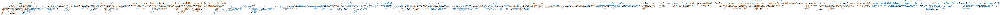

In [14]:
#visualizing the tree
dot_data = StringIO()

tree.export_graphviz(entr_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = entr_model.classes_) 

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [15]:
#evaluation metrics
print("Model Entropy - no max depth")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Above"' , metrics.precision_score(y_test,y_pred, pos_label = "Above"))
print('Precision score for "Equal or Below"' , metrics.precision_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Recall score for "Above"' , metrics.recall_score(y_test,y_pred, pos_label = "Above"))
print('Recall score for "Equal or Below"' , metrics.recall_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Depth of tree' , entr_model.tree_.max_depth)

Model Entropy - no max depth
Accuracy: 0.795723754130355
Balanced accuracy: 0.7285586547196161
Precision score for "Above" 0.7642799678197908
Precision score for "Equal or Below" 0.8050197158415222
Recall score for "Above" 0.5367870100517457
Recall score for "Equal or Below" 0.9203302993874865
Depth of tree 49


The entropy model with no max depth is fairly average but appears to have quite a bit of room for improvement. It seems much better at predicting the games that recieve less suggestions than the ones with above average suggestions.

### Model 2: Gini Impurity Model - No Max Depth

In [16]:
#assigning decision tree classifier model to variable gini_model
gini_model = tree.DecisionTreeClassifier(criterion="gini", random_state = 42)

#fitting and predicting the model
gini_model.fit(X_train, y_train)
y_pred = gini_model.predict(X_test)

#converting y_pred to a series
y_pred = pd.Series(y_pred)

#confirming model is created
gini_model

DecisionTreeClassifier(random_state=42)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.059618 to fit



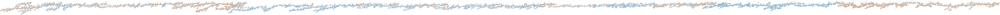

In [17]:
#visualizing the tree
dot_data = StringIO()

tree.export_graphviz(gini_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = gini_model.classes_) 

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [18]:
#evaluation metrics
print("Model Gini Impurity - no max depth")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Above"' , metrics.precision_score(y_test,y_pred, pos_label = "Above"))
print('Precision score for "Equal or Below"' , metrics.precision_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Recall score for "Above"' , metrics.recall_score(y_test,y_pred, pos_label = "Above"))
print('Recall score for "Equal or Below"' , metrics.recall_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Depth of tree' , gini_model.tree_.max_depth)

Model Gini Impurity - no max depth
Accuracy: 0.7953759347645456
Balanced accuracy: 0.7281390633582501
Precision score for "Above" 0.7635847698106815
Precision score for "Equal or Below" 0.8047715011703446
Recall score for "Above" 0.5361624933087492
Recall score for "Equal or Below" 0.9201156334077508
Depth of tree 52


The gini impurity model has almost identical performance to the entropy model but it is very slightly worse in every metric. This is not the best model for this project. I will now use a grid search to determine the best limits to place on the models to see if that increases performance.

### Model 3: Entropy Model With Max Depth

In [19]:
from sklearn.model_selection import GridSearchCV

#The first entropy model had a maximum depth of 49 branches so I will set the grid search to test a max depth of 
#a range up to 49 branches
param_grid = {'max_depth': np.arange(1, 49)}
entr_model2 = tree.DecisionTreeClassifier(criterion="entropy", random_state = 42)
entr_model2_cv = GridSearchCV(entr_model2,param_grid,cv=5)
entr_model2_cv.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(criterion='entropy',
                                              random_state=42),
             param_grid={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48])})

In [20]:
print("Best Score:" + str(entr_model2_cv.best_score_))
print("Best Parameters: " + str(entr_model2_cv.best_params_))

Best Score:0.7986368669072816
Best Parameters: {'max_depth': 16}


The best max depth is 16, so I will now run the model with that parameter to see how it compares to the model with no max depth

In [21]:
#assigning decision tree classifier model to variable entr_model
entr_model = tree.DecisionTreeClassifier(criterion="entropy", max_depth=16, random_state = 42)

#fitting and predicting the model
entr_model.fit(X_train, y_train)
y_pred = entr_model.predict(X_test)

#converting y_pred to a series
y_pred = pd.Series(y_pred)

#confirming model is created
entr_model

DecisionTreeClassifier(criterion='entropy', max_depth=16, random_state=42)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.103348 to fit



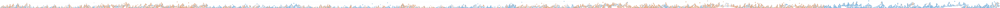

In [22]:
#visualizing the tree
dot_data = StringIO()

tree.export_graphviz(entr_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = entr_model.classes_) 

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [23]:
#evaluation metrics
print("Model Entropy - Max Depth 16")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Above"' , metrics.precision_score(y_test,y_pred, pos_label = "Above"))
print('Precision score for "Equal or Below"' , metrics.precision_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Recall score for "Above"' , metrics.recall_score(y_test,y_pred, pos_label = "Above"))
print('Recall score for "Equal or Below"' , metrics.recall_score(y_test,y_pred, pos_label = "Equal or Below"))

Model Entropy - Max Depth 16
Accuracy: 0.7989120983169408
Balanced accuracy: 0.7341675381239783
Precision score for "Above" 0.7655103816983713
Precision score for "Equal or Below" 0.8090660552076903
Recall score for "Above" 0.5493070838041991
Recall score for "Equal or Below" 0.9190279924437575


This model seems to perform slightly better than model one in every metric except recall for games receiving less than or equal to the average number of suggestions. So far this is likely the best model, however I still have to test the Gini Impurity model with optimum max depth.

### Model 4: Gini Impurity Model With Max Depth

In [24]:
#The first gini model had a maximum depth of 52 branches so I will set the grid search to test a max depth of 
#a range up to 52 branches
param_grid = {'max_depth': np.arange(1, 52)}
gini_model2 = tree.DecisionTreeClassifier(criterion="gini", random_state = 42)
gini_model2_cv = GridSearchCV(gini_model2,param_grid,cv=5)
gini_model2_cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51])})

In [25]:
print("Best Score:" + str(gini_model2_cv.best_score_))
print("Best Parameters: " + str(gini_model2_cv.best_params_))

Best Score:0.7987693693399436
Best Parameters: {'max_depth': 15}


The best max depth is 15, so I will now run the model with that parameter to see how it compares to the model with no max depth

In [26]:
#assigning decision tree classifier model to variable gini_model
gini_model = tree.DecisionTreeClassifier(criterion="gini", max_depth=15, random_state = 42)

#fitting and predicting the model
gini_model.fit(X_train, y_train)
y_pred = gini_model.predict(X_test)

#converting y_pred to a series
y_pred = pd.Series(y_pred)

#confirming model is created
gini_model

DecisionTreeClassifier(max_depth=15, random_state=42)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.10865 to fit



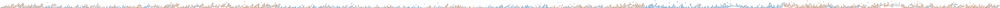

In [27]:
#visualizing the tree
dot_data = StringIO()

tree.export_graphviz(gini_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = gini_model.classes_) 

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [28]:
#evaluation metrics
print("Model Gini Impurity - Max Depth 15")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Above"' , metrics.precision_score(y_test,y_pred, pos_label = "Above"))
print('Precision score for "Equal or Below"' , metrics.precision_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Recall score for "Above"' , metrics.recall_score(y_test,y_pred, pos_label = "Above"))
print('Recall score for "Equal or Below"' , metrics.recall_score(y_test,y_pred, pos_label = "Equal or Below"))

Model Gini Impurity - Max Depth 15
Accuracy: 0.7984193542153775
Balanced accuracy: 0.7327920832763078
Precision score for "Above" 0.7667865206120913
Precision score for "Equal or Below" 0.8079262163248895
Recall score for "Above" 0.545411288883602
Recall score for "Equal or Below" 0.9201728776690137


This model is less accurate than the entropy model, but it is more precise when predicting above average suggestions and has a better recall score when predicting below average suggestions. Like the entropy model, it also outperforms the version with no max depth in every metric except recall score for below average suggestions. I want to see if I can do better than 80% accuracy. I will make it a random forest classification model and use gridsearchcv to find the optimum max depth.

### Model 5: RandomForestClassifier - No Max Depth

In [29]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state= 42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
y_pred = pd.Series(y_pred)
rf_model

RandomForestClassifier(random_state=42)

I will not visualize the random forest as it is a collection of decision trees and I would need to select one to visualize

In [30]:
#evaluation metrics
print("Model Random Forest - no max depth")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Above"' , metrics.precision_score(y_test,y_pred, pos_label = "Above"))
print('Precision score for "Equal or Below"' , metrics.precision_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Recall score for "Above"' , metrics.recall_score(y_test,y_pred, pos_label = "Above"))
print('Recall score for "Equal or Below"' , metrics.recall_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Depth of trees' , max([estimator.get_depth() for estimator in rf_model.estimators_]))

Model Random Forest - no max depth
Accuracy: 0.8000328496067709
Balanced accuracy: 0.7325908388678504
Precision score for "Above" 0.7763906109709693
Precision score for "Equal or Below" 0.8069352040243156
Recall score for "Above" 0.5400285493368226
Recall score for "Equal or Below" 0.925153128398878
Depth of trees 74


This is the most accurate model so far and seems precise at predicting above average games while having a very strong recall score for below average games. Next I will try to tune the hyperparameters to see if I can improve the results.

### Model 6: RandomForestClassifier With Tuned Hyperparameters

This model was far too large to run with GridSearchCV. To do the parameter optimization in a shorter period of time, I will use RandomizedSearchCV for this model

In [31]:
#The first randomforest model had a maximum depth of 74 branches so I will set the grid search to test a max depth of 
#a range up to 74 branches. I will also test different numbers of estimators
#param_grid = {'max_depth': np.arange(1, 74), 'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]}
#rf_model2 = RandomForestClassifier(random_state = 42)
#rf_model2_cv = GridSearchCV(rf_model2,param_grid,cv=5,verbose=100, n_jobs=-1)
#rf_model2_cv.fit(X_train, y_train)

In [34]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'max_depth': np.arange(1, 74),
    'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
    'criterion' : ['gini', 'entropy'],
    'bootstrap':[True, False]
}

rf_model2 = RandomForestClassifier(random_state = 42)

#n_iter is set to 59 to get 95% confidence parameters are in the top 5% as per this article: 
# https://towardsdatascience.com/hyper-parameter-tuning-with-randomised-grid-search-54f865d27926
rf_model2_cv = RandomizedSearchCV(RandomForestClassifier(), param_grid, n_iter=59, cv=5, verbose=100)
rf_model2_cv.fit(X_train, y_train)

Fitting 5 folds for each of 59 candidates, totalling 295 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV] n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False 
[CV]  n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False, score=0.678, total=  21.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.9s remaining:    0.0s
[CV] n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False 
[CV]  n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False, score=0.679, total=  21.6s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   42.6s remaining:    0.0s
[CV] n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False 
[CV]  n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False, score=0.679, total=  21.3s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.1min remaining:    0.0s
[CV] n_estimators=800, max_depth=1, criterion=entropy, bootstrap=False 
[CV]  n_estimators=800, max_d

[CV]  n_estimators=1400, max_depth=7, criterion=entropy, bootstrap=False, score=0.782, total= 2.2min
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed: 148.0min remaining:    0.0s
[CV] n_estimators=1400, max_depth=7, criterion=entropy, bootstrap=False 
[CV]  n_estimators=1400, max_depth=7, criterion=entropy, bootstrap=False, score=0.784, total= 2.2min
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed: 150.2min remaining:    0.0s
[CV] n_estimators=1400, max_depth=7, criterion=entropy, bootstrap=False 
[CV]  n_estimators=1400, max_depth=7, criterion=entropy, bootstrap=False, score=0.783, total= 2.2min
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed: 152.4min remaining:    0.0s
[CV] n_estimators=1600, max_depth=47, criterion=entropy, bootstrap=True 
[CV]  n_estimators=1600, max_depth=47, criterion=entropy, bootstrap=True, score=0.800, total= 7.5min
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed: 160.0min remaining:    0.0s
[CV] n_estimators=1600, max_depth=47, criterion=entro

[CV]  n_estimators=800, max_depth=72, criterion=gini, bootstrap=True, score=0.800, total= 3.7min
[Parallel(n_jobs=1)]: Done  66 out of  66 | elapsed: 362.3min remaining:    0.0s
[CV] n_estimators=800, max_depth=72, criterion=gini, bootstrap=True ..
[CV]  n_estimators=800, max_depth=72, criterion=gini, bootstrap=True, score=0.802, total= 3.7min
[Parallel(n_jobs=1)]: Done  67 out of  67 | elapsed: 366.0min remaining:    0.0s
[CV] n_estimators=800, max_depth=72, criterion=gini, bootstrap=True ..
[CV]  n_estimators=800, max_depth=72, criterion=gini, bootstrap=True, score=0.801, total= 3.7min
[Parallel(n_jobs=1)]: Done  68 out of  68 | elapsed: 369.7min remaining:    0.0s
[CV] n_estimators=800, max_depth=72, criterion=gini, bootstrap=True ..
[CV]  n_estimators=800, max_depth=72, criterion=gini, bootstrap=True, score=0.800, total= 3.7min
[Parallel(n_jobs=1)]: Done  69 out of  69 | elapsed: 373.4min remaining:    0.0s
[CV] n_estimators=800, max_depth=72, criterion=gini, bootstrap=True ..
[CV]

[CV]  n_estimators=800, max_depth=36, criterion=entropy, bootstrap=True, score=0.801, total= 3.7min
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed: 528.5min remaining:    0.0s
[CV] n_estimators=800, max_depth=36, criterion=entropy, bootstrap=True 
[CV]  n_estimators=800, max_depth=36, criterion=entropy, bootstrap=True, score=0.799, total= 3.7min
[CV] n_estimators=600, max_depth=39, criterion=gini, bootstrap=False .
[CV]  n_estimators=600, max_depth=39, criterion=gini, bootstrap=False, score=0.800, total= 3.9min
[CV] n_estimators=600, max_depth=39, criterion=gini, bootstrap=False .
[CV]  n_estimators=600, max_depth=39, criterion=gini, bootstrap=False, score=0.802, total= 3.9min
[CV] n_estimators=600, max_depth=39, criterion=gini, bootstrap=False .
[CV]  n_estimators=600, max_depth=39, criterion=gini, bootstrap=False, score=0.802, total= 3.8min
[CV] n_estimators=600, max_depth=39, criterion=gini, bootstrap=False .
[CV]  n_estimators=600, max_depth=39, criterion=gini, bootstrap=False

[CV]  n_estimators=200, max_depth=30, criterion=gini, bootstrap=True, score=0.803, total=  53.5s
[CV] n_estimators=200, max_depth=30, criterion=gini, bootstrap=True ..
[CV]  n_estimators=200, max_depth=30, criterion=gini, bootstrap=True, score=0.803, total=  53.3s
[CV] n_estimators=200, max_depth=30, criterion=gini, bootstrap=True ..
[CV]  n_estimators=200, max_depth=30, criterion=gini, bootstrap=True, score=0.802, total=  53.4s
[CV] n_estimators=200, max_depth=30, criterion=gini, bootstrap=True ..
[CV]  n_estimators=200, max_depth=30, criterion=gini, bootstrap=True, score=0.799, total=  53.1s
[CV] n_estimators=400, max_depth=41, criterion=gini, bootstrap=False .
[CV]  n_estimators=400, max_depth=41, criterion=gini, bootstrap=False, score=0.799, total= 2.6min
[CV] n_estimators=400, max_depth=41, criterion=gini, bootstrap=False .
[CV]  n_estimators=400, max_depth=41, criterion=gini, bootstrap=False, score=0.802, total= 2.6min
[CV] n_estimators=400, max_depth=41, criterion=gini, bootstra

[CV]  n_estimators=1000, max_depth=45, criterion=gini, bootstrap=True, score=0.799, total= 6.5min
[CV] n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False 
[CV]  n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False, score=0.799, total=13.8min
[CV] n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False 
[CV]  n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False, score=0.800, total=13.0min
[CV] n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False 
[CV]  n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False, score=0.800, total=13.0min
[CV] n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False 
[CV]  n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False, score=0.798, total=13.1min
[CV] n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False 
[CV]  n_estimators=2000, max_depth=63, criterion=gini, bootstrap=False, score=0.797, total=13.1min
[CV] n_estimators=1200, max_depth=51, criterion=entr

[CV]  n_estimators=200, max_depth=28, criterion=entropy, bootstrap=False, score=0.803, total= 1.2min
[CV] n_estimators=200, max_depth=28, criterion=entropy, bootstrap=False 
[CV]  n_estimators=200, max_depth=28, criterion=entropy, bootstrap=False, score=0.802, total= 1.2min
[CV] n_estimators=200, max_depth=28, criterion=entropy, bootstrap=False 
[CV]  n_estimators=200, max_depth=28, criterion=entropy, bootstrap=False, score=0.800, total= 1.2min
[CV] n_estimators=400, max_depth=9, criterion=gini, bootstrap=False ..
[CV]  n_estimators=400, max_depth=9, criterion=gini, bootstrap=False, score=0.790, total=  50.5s
[CV] n_estimators=400, max_depth=9, criterion=gini, bootstrap=False ..
[CV]  n_estimators=400, max_depth=9, criterion=gini, bootstrap=False, score=0.791, total=  50.3s
[CV] n_estimators=400, max_depth=9, criterion=gini, bootstrap=False ..
[CV]  n_estimators=400, max_depth=9, criterion=gini, bootstrap=False, score=0.790, total=  50.6s
[CV] n_estimators=400, max_depth=9, criterion=g

[CV]  n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True, score=0.800, total= 6.6min
[CV] n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True 
[CV]  n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True, score=0.802, total= 6.6min
[CV] n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True 
[CV]  n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True, score=0.802, total= 6.5min
[CV] n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True 
[CV]  n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True, score=0.800, total= 6.6min
[CV] n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True 
[CV]  n_estimators=1400, max_depth=72, criterion=entropy, bootstrap=True, score=0.798, total= 6.5min
[Parallel(n_jobs=1)]: Done 295 out of 295 | elapsed: 1554.6min finished


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=59,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73]),
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   verbose=100)

In [35]:
print("Best Score:" + str(rf_model2_cv.best_score_))
print("Best Parameters: " + str(rf_model2_cv.best_params_))

Best Score:0.8031047016545616
Best Parameters: {'n_estimators': 800, 'max_depth': 22, 'criterion': 'entropy', 'bootstrap': False}


Now to run the Random Forest model with the best parameters

In [36]:
rf_model = RandomForestClassifier(n_estimators=800, max_depth=22, criterion='entropy', bootstrap=False, random_state= 42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
y_pred = pd.Series(y_pred)
rf_model

RandomForestClassifier(bootstrap=False, criterion='entropy', max_depth=22,
                       n_estimators=800, random_state=42)

In [38]:
#evaluation metrics
print("Model Random Forest - optimized parameters")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Above"' , metrics.precision_score(y_test,y_pred, pos_label = "Above"))
print('Precision score for "Equal or Below"' , metrics.precision_score(y_test,y_pred, pos_label = "Equal or Below"))
print('Recall score for "Above"' , metrics.recall_score(y_test,y_pred, pos_label = "Above"))
print('Recall score for "Equal or Below"' , metrics.recall_score(y_test,y_pred, pos_label = "Equal or Below"))

Model Random Forest - optimized parameters
Accuracy: 0.8033274719329095
Balanced accuracy: 0.7360568260135056
Precision score for "Above" 0.7845929484429957
Precision score for "Equal or Below" 0.8087743802065147
Recall score for "Above" 0.5439838220424671
Recall score for "Equal or Below" 0.9281298299845441


This model outperforms the untuned model in every metric, but some of the other models are better at certain metrics so now it is time to decide which metrics to prioritize. In a real world situation, when predicting that a game is going to have above average suggestions, false positives would lead to costly investment in a game that might not be popular enough to make back the money. False negatives in this situation would mean that money is not invested in a game that is likely to be successful, however the company could easily make a profit investing the money in a different game that is predicted to be successful. So for predicting above average games precision seems to be more important than recall to avoid false positives. When predicting that a game will be unpopular, the inverse is true so recall becomes the most important to avoid false negatives.

The tuned random forest model performs the best of all six models at precision score for above average games and recall score for equal or below average games. It also is the most accurate model. Therefore it is the best model for this problem.